# Split survey data into lines

We will try and automatically split a survey into flight lines using various techniques and compare there results to the hand-split lines from the published survey data.

In [1]:
%load_ext autoreload
%autoreload 2


import numpy as np
import pandas as pd
import plotly.io as pio

import airbornegeo

pio.renderers.default = "notebook"

## Load data

This is a subset of the BAS AGAP survey over Antarctica's Gamburtsev Subglacial Mountains. The file is downloaded and subset in the notebook `AGAP_magnetic_survey`.

In [2]:
data_df = pd.read_csv("data/AGAP_magnetic_survey_processed_blocked.csv")

# only keep relevant columns
data_df = data_df[
    [
        "easting",
        "northing",
        "latitude",
        "longitude",
        "unixtime",
        "line",
    ]
]

# retain only a subset of lines
data_df = data_df[(data_df.line.between(168, 176)) | (data_df.line.between(90, 127))]

# rename lines starting from 1
data_df["original_line"] = airbornegeo.unique_line_id(data_df, "line")
data_df = data_df.drop(columns="line")

# sort by time and line
# data_df = data_df.sort_values(by=["original_line", "unixtime"])
data_df = data_df.sort_values(by=["unixtime"])

data_df.head()

,easting,northing,latitude,longitude,unixtime,original_line
296434,1.307592e+06,550872.871854,-76.994863,67.154886,1.229692e+09,39
296435,1.307687e+06,550688.969771,-76.994719,67.163218,1.229692e+09,39
296436,1.307759e+06,550494.204796,-76.994795,67.171604,1.229692e+09,39
296437,1.307808e+06,550291.472678,-76.995097,67.179919,1.229692e+09,39
296438,1.307832e+06,550082.907535,-76.995633,67.188056,1.229692e+09,39


In [3]:
print(f"Originally {len(data_df.original_line.unique())} lines")

Originally 47 lines


In [4]:
airbornegeo.plotly_points(
    data_df,
    color_col="original_line",
    hover_cols=[
        "unixtime",
    ],
    robust=False,
    size=3,
)

## Split lines on time gaps
Here we assume any time gap greater than 2 minutes between successive points marks the end of one line and the start of another. 

In [5]:
data_df["segments_by_time"] = airbornegeo.split_into_segments(
    data_df,
    threshold=60 * 2,  # 2 minutes
    column_name="unixtime",
)
print(f"{len(data_df.segments_by_time.unique())} segments")

46 segments


Average jump between points: 3.19 seconds


count    59162.000000
mean         3.192598
std          0.440530
min          1.500000
25%          3.000000
50%          3.000000
75%          3.500000
max          5.000000
Name: time_dif, dtype: float64

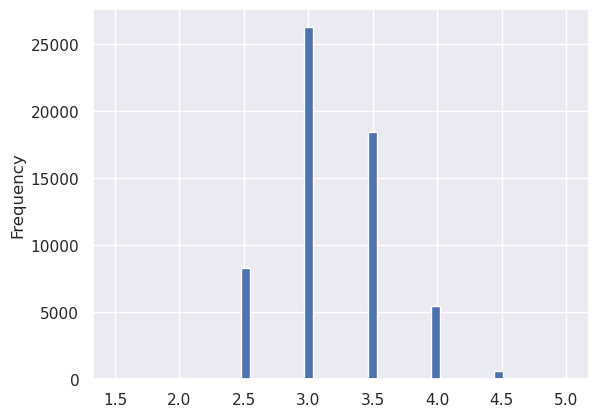

In [6]:
data_df["time_dif"] = data_df.groupby("segments_by_time").unixtime.diff()
print(f"Average jump between points: {np.mean(data_df['time_dif']):.2f} seconds")
data_df.time_dif.plot.hist(bins=50)
data_df["time_dif"].describe()

In [7]:
airbornegeo.plotly_points(
    data_df,
    color_col="segments_by_time",
    hover_cols=[
        "original_line",
        "unixtime",
    ],
    robust=False,
    size=3,
)

## Split lines on distance gaps
Here we assume any distance gap greater than 5 km between successive points marks the end of one line and the start of another. 

In [8]:
data_df["relative_distance"] = airbornegeo.relative_distance(
    data_df,
)

data_df["segments_by_distance"] = airbornegeo.split_into_segments(
    data_df,
    threshold=5e3,  # 5 km
    column_name="relative_distance",
)
print(f"{len(data_df.segments_by_distance.unique())} segments")

46 segments


In [9]:
airbornegeo.plotly_points(
    data_df,
    color_col="segments_by_distance",
    hover_cols=["original_line", "relative_distance"],
    robust=False,
    size=3,
)

## Split lines on track / heading changes
Here we assume any change of track (heading) more than 45 degrees between successive points marks the end of one line and the start of another. First we need to calculate the track from the latitude and longitude of the data.

In [10]:
data_df["track"] = airbornegeo.track(
    data_df,
    latitude_column="latitude",
    longitude_column="longitude",
    ellipsoid=False,
)

airbornegeo.plotly_points(
    data_df,
    color_col="track",
    hover_cols=["original_line"],
    size=3,
)

In [11]:
data_df = data_df.sort_values("unixtime")
data_df["segments_by_track"] = airbornegeo.split_into_segments(
    data_df,
    threshold=40,  # 20 degree track change
    column_name="track",
    angular_difference=True,  # the difference between two values on either side of (0/360) should be small
)
print(f"{len(data_df.segments_by_track.unique())} segments")

67 segments


In [12]:
airbornegeo.plotly_points(
    data_df,
    color_col="segments_by_track",
    hover_cols=["original_line", "track"],
    robust=False,
    size=3,
)